**SegResNet, FedProx, ISLES'24**

**Transfer Learning ISLES22 -> ISLES24**

In [1]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [2]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd, Spacingd, CropForegroundd, RandCropByPosNegLabeld
from monai.networks.nets import SegResNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from monai.data import list_data_collate
from monai.inferers import SlidingWindowInferer

from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
import shutil

In [3]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [4]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "E:/FYP/ISLES24 Split Preprocessed"
print(data_dir)

E:/FYP/ISLES24 Split Preprocessed


In [5]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "E:/FYP/SegResNet/Federated_SegResNet_checkpoints"
log_dir = "E:/FYP/SegResNet/Federated_SegResNet_logs"

# Remove old directories if they exist
if os.path.exists(checkpoint_dir):
    shutil.rmtree(checkpoint_dir)

if os.path.exists(log_dir):
    shutil.rmtree(log_dir)

# Recreate directories
os.makedirs(checkpoint_dir)
os.makedirs(log_dir)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

# %load_ext tensorboard
# %tensorboard --logdir "D:/F25-156/SegResNet/Federated_SegResNet_logs"

Checkpoints will be saved to: E:/FYP/SegResNet/Federated_SegResNet_checkpoints
TensorBoard logs will be saved to: E:/FYP/SegResNet/Federated_SegResNet_logs


In [6]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

In [7]:
print(torch.__version__)
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

2.5.1+cu121
CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


**MONAI Preprocessing Transforms**

In [8]:
# target_shape = (128, 128, 128)

# transform = Compose([
#     LoadImaged(keys=["image", "label"]),
    
#     EnsureChannelFirstd(keys=["image", "label"]),
    
#     Orientationd(keys=["image", "label"], axcodes="RAS"),

#     Spacingd(
#         keys=["image", "label"],
#         pixdim=(1.0, 1.0, 1.0),
#         mode=("bilinear", "nearest")
#     ),

#     # ⭐ Crop based on image, applied to both
#     CropForegroundd(
#         keys=["image", "label"],
#         source_key="image",
#     ),

#     # ⭐ Make uniform shape
#     ResizeWithPadOrCropd(
#         keys=["image", "label"],
#         spatial_size=target_shape
#     ),

#     # Only normalize image
#     NormalizeIntensityd(keys=["image"], nonzero=True)
# ])

#now minimal pre processing is required
transform = Compose([
    LoadImaged(keys=["image", "label"]),
    EnsureChannelFirstd(keys=["image", "label"]),
])

**Dataset Class**

In [9]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


**Load Files and Apply MONAI Transforms**

In [10]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files, transform=None):
        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.transform = transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):
        data = {
            "image": self.dwi_files[idx],
            "label": self.mask_files[idx]
        }

        if self.transform:
            data = self.transform(data)

        image = data["image"].float()
        mask = data["label"].long()

        return {
            "image": image,
            "mask": mask
        }

**Split into “Clients” (Federated Simulation)**


Client 0
Preprocessed samples: 50

🟢 PREPROCESSED SAMPLES
Sample 40 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0])


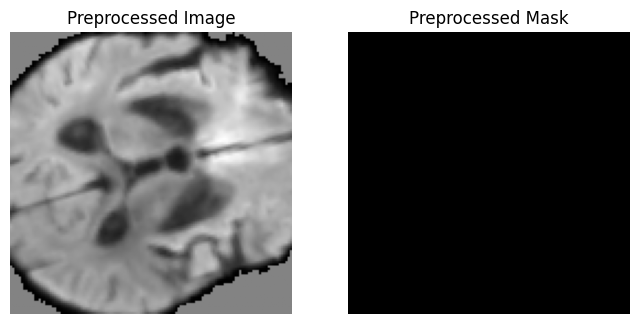

Sample 7 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


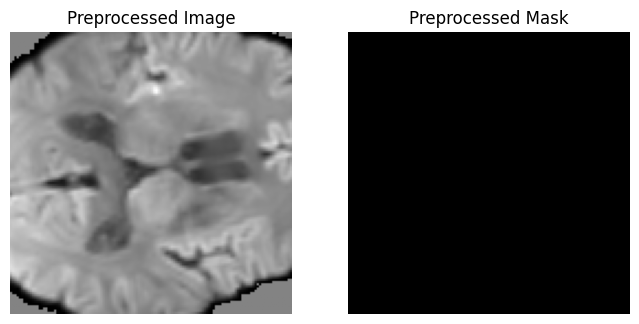


Client 0 dataset size: 50

Client 1
Preprocessed samples: 50

🟢 PREPROCESSED SAMPLES
Sample 1 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


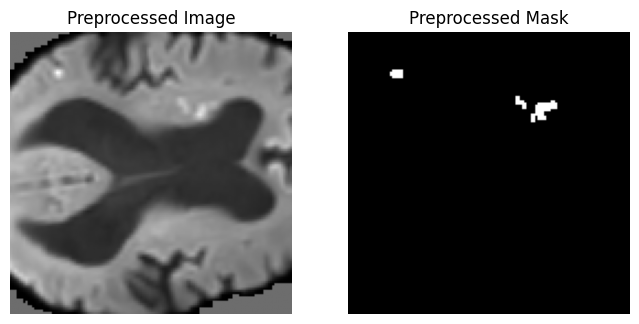

Sample 47 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


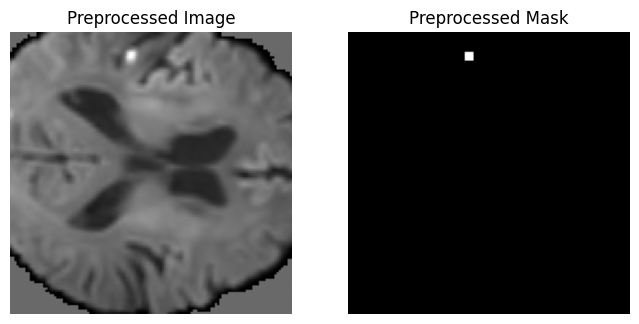


Client 1 dataset size: 50


In [11]:

original_root = "E:/FYP/ISLES24 Split"
processed_root = "E:/FYP/ISLES24 Split Preprocessed"

num_clients = 2
client_datasets = []

# -----------------------------
# Loop over clients
# -----------------------------
for i in range(num_clients):

    print("\n" + "="*60)
    print(f"Client {i}")
    print("="*60)

    # -----------------------------
    # ORIGINAL (raw split)
    # -----------------------------
    # orig_img_dir = os.path.join(original_root, "train", f"client_{i}", "DWI")
    # orig_mask_dir = os.path.join(original_root, "train", f"client_{i}", "masks")

    # dwi_files = sorted(glob(os.path.join(orig_img_dir, "*.nii*")))
    # mask_files = sorted(glob(os.path.join(orig_mask_dir, "*.nii*")))

    # -----------------------------
    # PREPROCESSED
    # -----------------------------
    proc_img_dir = os.path.join(processed_root, "train", f"client_{i}", "DWI")
    proc_mask_dir = os.path.join(processed_root, "train", f"client_{i}", "masks")

    proc_dwi = sorted(glob(os.path.join(proc_img_dir, "*.nii*")))
    proc_mask = sorted(glob(os.path.join(proc_mask_dir, "*.nii*")))

    print(f"Preprocessed samples: {len(proc_dwi)}")

    # -----------------------------
    # Pick random samples
    # -----------------------------
    sample_indices = random.sample(range(len(proc_dwi)), k=2)

    # =========================================================
    # RAW VISUALIZATION
    # =========================================================
    # print("\n🔵 RAW SAMPLES")
    # for idx in sample_indices:

    #     img = nib.load(dwi_files[idx]).get_fdata()
    #     mask = nib.load(mask_files[idx]).get_fdata()

    #     print(
    #         f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | "
    #         f"Mask values: {torch.unique(torch.tensor(mask))}"
    #     )

    #     mid = img.shape[2] // 2

    #     plt.figure(figsize=(8,4))
    #     plt.subplot(1,2,1)
    #     plt.imshow(img[:,:,mid], cmap="gray")
    #     plt.title("Raw Image")
    #     plt.axis("off")

    #     plt.subplot(1,2,2)
    #     plt.imshow(mask[:,:,mid], cmap="gray")
    #     plt.title("Raw Mask")
    #     plt.axis("off")
    #     plt.show()

    # =========================================================
    # PREPROCESSED VISUALIZATION
    # =========================================================
    print("\n🟢 PREPROCESSED SAMPLES")

    # dataset uses ONLY minimal transform
    ds = ISLESDataset(
        dwi_files=proc_dwi,
        mask_files=proc_mask,
        transform=transform,
    )

    client_datasets.append(ds)

    for idx in sample_indices:

        sample = ds[idx]

        img_proc = sample["image"][0].numpy()
        mask_proc = sample["mask"][0].numpy()

        print(
            f"Sample {idx} | Image shape: {img_proc.shape} | "
            f"Mask shape: {mask_proc.shape} | Mask values: {torch.unique(sample['mask'])}"
        )

        mid = img_proc.shape[2] // 2

        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid], cmap="gray")
        plt.title("Preprocessed Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid], cmap="gray")
        plt.title("Preprocessed Mask")
        plt.axis("off")
        plt.show()

    print(f"\nClient {i} dataset size: {len(ds)}")

**Validation Set**

In [12]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    transform=transform,
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 20


In [13]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [14]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda:0


## SegResNet

In [15]:
def create_model():
    model = SegResNet(
        spatial_dims=3,
        in_channels=1,          # DWI is single channel
        out_channels=1,         # Binary lesion mask
        init_filters=16,        # similar starting capacity as UNet
        blocks_down=(1, 2, 2, 4),
        blocks_up=(1, 1, 1),
        dropout_prob=0.2
    ).to(device)
    print(model)
    return model

In [16]:
def print_model_weights(model, name="Model", num_values=5):

    print(f"\n{name} Weights Check")

    for param_name, param_tensor in model.state_dict().items():

        # print only floating tensors
        if torch.is_floating_point(param_tensor):

            flat = param_tensor.flatten()

            print(
                f"{param_name}: "
                f"{flat[:num_values].tolist()}"
            )

            # print only first layer for readability
            break

**Client Class**

In [17]:
class Client:
    def __init__(self, client_id, dataset, device, mu=0.01):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True, collate_fn=list_data_collate)
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-4)
        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.mu = mu   # FedProx coefficient
    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)


    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0

        # store global parameters
        global_params = [param.clone().detach() for param in self.model.parameters()]
        
        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)

                # FedProx proximal term 
                prox_term = 0.0
                for param, global_param in zip(self.model.parameters(), global_params):
                    prox_term += torch.norm(param - global_param) ** 2

                loss = loss + (self.mu / 2) * prox_term

                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)

        # Return last epoch metrics
        return avg_loss, mean_dice, mean_iou, mean_hd95

**Server Class**

In [18]:
class Server:
    def __init__(self, val_loader, device, pretrained_path="segresnet_isles22_epoch50.pth"):
        self.device = device
        self.global_model = create_model().to(device)

        # Load pretrained weights
        checkpoint = torch.load(pretrained_path, map_location=device)

        # CASE 1:
        # if checkpoint directly contains state_dict
        if isinstance(checkpoint, dict) and "model_state_dict" not in checkpoint:
            self.global_model.load_state_dict(checkpoint)
            print(f"Loaded pretrained model from {pretrained_path}")

        # CASE 2:
        # if saved as {"model_state_dict": ...}
        else:
            self.global_model.load_state_dict(
                checkpoint["model_state_dict"]
            )
            print(f"Loaded pretrained model from {pretrained_path}")
        
        # PRINT GLOBAL MODEL WEIGHTS
        print_model_weights(self.global_model, "Global Pretrained Model")



        self.val_loader = val_loader

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)

    def aggregate(self, client_params_list):
        new_params = {}

        for key in client_params_list[0].keys():
            param = client_params_list[0][key]

            # Only average floating point tensors
            if torch.is_floating_point(param):
                new_params[key] = param.clone()

                for i in range(1, len(client_params_list)):
                    # prevent device inconsistency- if client tensors are on different devices (CPU vs GPU), this can crash:
                    new_params[key] += client_params_list[i][key].to(param.device)

                new_params[key] /= len(client_params_list)

            else:
                # Copy non-float params (int, bool, etc.) directly
                new_params[key] = param.clone()

        self.global_model.load_state_dict(new_params)

    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)
            print_model_weights( client.model, f"Client {client.id}")

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()
        # mean_hd95 = self.hd_metric.aggregate().item()
        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')  # or 0
        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Save best global model
        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")
            print(f"Best global model updated with Dice={mean_dice:.4f}")


        return avg_loss, mean_dice, mean_iou, mean_hd95

In [19]:
#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device, pretrained_path="segresnet_isles22_epoch50.pth")

SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 32, eps=1e-05, a

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


**Federated Training loop**

In [20]:
communication_rounds = 10  # upper bound
local_epochs = 20
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 2   # stop if Dice does not improve for 2 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95 = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)


        client_params.append(client.get_parameters())

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params)

    # ---- Validation on global model ----
    val_loss, val_dice, val_iou, val_hd95 = server.validate()

    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)

    # TensorBoard logging
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    print(f"Global | Val Loss={val_loss:.4f} | Dice={val_dice:.4f} | IoU={val_iou:.4f} | HD95={val_hd95:.4f}")

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")

     # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------

    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---

Client 0 Weights Check
convInit.conv.weight: [-0.04282276704907417, 0.03777192533016205, -0.08304842561483383, 0.13256610929965973, 0.19442035257816315]

Client 1 Weights Check
convInit.conv.weight: [-0.04282276704907417, 0.03777192533016205, -0.08304842561483383, 0.13256610929965973, 0.19442035257816315]


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.4051 | Dice: 0.4972 | IoU: 0.3309 | HD95: 57.0888


Client 0 | Epoch 2/20 | Loss: 0.3239 | Dice: 0.6287 | IoU: 0.4585 | HD95: 30.6430


Client 0 | Epoch 3/20 | Loss: 0.3122 | Dice: 0.6413 | IoU: 0.4720 | HD95: 23.1778


Client 0 | Epoch 4/20 | Loss: 0.2889 | Dice: 0.6879 | IoU: 0.5242 | HD95: 28.3278


Client 0 | Epoch 5/20 | Loss: 0.2943 | Dice: 0.6810 | IoU: 0.5163 | HD95: 25.9544


Client 0 | Epoch 6/20 | Loss: 0.2801 | Dice: 0.7095 | IoU: 0.5498 | HD95: 26.6865


Client 0 | Epoch 7/20 | Loss: 0.2648 | Dice: 0.7277 | IoU: 0.5720 | HD95: 20.9645


Client 0 | Epoch 8/20 | Loss: 0.2680 | Dice: 0.7168 | IoU: 0.5586 | HD95: 18.6046


Client 0 | Epoch 9/20 | Loss: 0.2514 | Dice: 0.7475 | IoU: 0.5968 | HD95: 13.1891


Client 0 | Epoch 10/20 | Loss: 0.2501 | Dice: 0.7354 | IoU: 0.5815 | HD95: 12.4957


Client 0 | Epoch 11/20 | Loss: 0.2841 | Dice: 0.6858 | IoU: 0.5218 | HD95: 26.5293


Client 0 | Epoch 12/20 | Loss: 0.3005 | Dice: 0.6737 | IoU: 0.5079 | HD95: 23.7054


Client 0 | Epoch 13/20 | Loss: 0.2631 | Dice: 0.7276 | IoU: 0.5718 | HD95: 16.5614


Client 0 | Epoch 14/20 | Loss: 0.2573 | Dice: 0.7326 | IoU: 0.5780 | HD95: 17.4572


Client 0 | Epoch 15/20 | Loss: 0.2401 | Dice: 0.7521 | IoU: 0.6026 | HD95: 11.4282


Client 0 | Epoch 16/20 | Loss: 0.2553 | Dice: 0.7309 | IoU: 0.5759 | HD95: 12.8921


Client 0 | Epoch 17/20 | Loss: 0.2428 | Dice: 0.7464 | IoU: 0.5954 | HD95: 15.0163


Client 0 | Epoch 18/20 | Loss: 0.2304 | Dice: 0.7634 | IoU: 0.6173 | HD95: 13.6108


Client 0 | Epoch 19/20 | Loss: 0.2271 | Dice: 0.7649 | IoU: 0.6193 | HD95: 11.8943


Clients Training:  50%|█████     | 1/2 [07:06<07:06, 426.49s/it]

Client 0 | Epoch 20/20 | Loss: 0.2342 | Dice: 0.7563 | IoU: 0.6081 | HD95: 9.7550
Client 0 | Loss=0.2737 | Dice=0.7563 | IoU=0.6081 | HD95=9.7550


Client 1 | Epoch 1/20 | Loss: 0.4136 | Dice: 0.5067 | IoU: 0.3393 | HD95: 50.9758


Client 1 | Epoch 2/20 | Loss: 0.3515 | Dice: 0.6018 | IoU: 0.4305 | HD95: 36.9164


Client 1 | Epoch 3/20 | Loss: 0.3122 | Dice: 0.6653 | IoU: 0.4985 | HD95: 23.9151


Client 1 | Epoch 4/20 | Loss: 0.3059 | Dice: 0.6743 | IoU: 0.5086 | HD95: 26.0703


Client 1 | Epoch 5/20 | Loss: 0.2863 | Dice: 0.7024 | IoU: 0.5413 | HD95: 19.0219


Client 1 | Epoch 6/20 | Loss: 0.2643 | Dice: 0.7352 | IoU: 0.5812 | HD95: 17.7027


Client 1 | Epoch 7/20 | Loss: 0.2622 | Dice: 0.7357 | IoU: 0.5819 | HD95: 15.9116


Client 1 | Epoch 8/20 | Loss: 0.3078 | Dice: 0.6686 | IoU: 0.5021 | HD95: 23.4825


Client 1 | Epoch 9/20 | Loss: 0.2713 | Dice: 0.7264 | IoU: 0.5703 | HD95: 20.2575


Client 1 | Epoch 10/20 | Loss: 0.2665 | Dice: 0.7324 | IoU: 0.5778 | HD95: 17.1566


Client 1 | Epoch 11/20 | Loss: 0.2461 | Dice: 0.7569 | IoU: 0.6089 | HD95: 11.2132


Client 1 | Epoch 12/20 | Loss: 0.2454 | Dice: 0.7528 | IoU: 0.6036 | HD95: 11.1900


Client 1 | Epoch 13/20 | Loss: 0.2755 | Dice: 0.7137 | IoU: 0.5548 | HD95: 19.6737


Client 1 | Epoch 14/20 | Loss: 0.2711 | Dice: 0.7211 | IoU: 0.5638 | HD95: 20.2520


Client 1 | Epoch 15/20 | Loss: 0.2440 | Dice: 0.7585 | IoU: 0.6110 | HD95: 13.6898


Client 1 | Epoch 16/20 | Loss: 0.2409 | Dice: 0.7601 | IoU: 0.6131 | HD95: 11.6806


Client 1 | Epoch 17/20 | Loss: 0.2344 | Dice: 0.7646 | IoU: 0.6189 | HD95: 9.9215


Client 1 | Epoch 18/20 | Loss: 0.2834 | Dice: 0.6928 | IoU: 0.5300 | HD95: 20.1475


Client 1 | Epoch 19/20 | Loss: 0.2743 | Dice: 0.7162 | IoU: 0.5578 | HD95: 19.7964


Client 1 Epochs: 100%|██████████| 20/20 [07:21<00:00, 22.07s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.2483 | Dice: 0.7474 | IoU: 0.5967 | HD95: 15.1116
Client 1 | Loss=0.2803 | Dice=0.7474 | IoU=0.5967 | HD95=15.1116


Best global model updated with Dice=0.7208
Global | Val Loss=0.2209 | Dice=0.7208 | IoU=0.5635 | HD95=13.4361
Checkpoint saved for round 1 at E:/FYP/SegResNet/Federated_SegResNet_checkpoints\federated_round1.pth

--- Communication Round 2 ---

Client 0 Weights Check
convInit.conv.weight: [-0.048008356243371964, 0.029192732647061348, -0.09357679635286331, 0.13091637194156647, 0.1886371225118637]

Client 1 Weights Check
convInit.conv.weight: [-0.048008356243371964, 0.029192732647061348, -0.09357679635286331, 0.13091637194156647, 0.1886371225118637]


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2338 | Dice: 0.7245 | IoU: 0.5680 | HD95: 21.5787


Client 0 | Epoch 2/20 | Loss: 0.2340 | Dice: 0.7351 | IoU: 0.5812 | HD95: 19.4012


Client 0 | Epoch 3/20 | Loss: 0.2354 | Dice: 0.7261 | IoU: 0.5700 | HD95: 19.3523


Client 0 | Epoch 4/20 | Loss: 0.2604 | Dice: 0.6973 | IoU: 0.5353 | HD95: 19.3882


Client 0 | Epoch 5/20 | Loss: 0.2711 | Dice: 0.6889 | IoU: 0.5255 | HD95: 26.4708


Client 0 | Epoch 6/20 | Loss: 0.3096 | Dice: 0.6437 | IoU: 0.4746 | HD95: 25.3919


Client 0 | Epoch 7/20 | Loss: 0.2615 | Dice: 0.7262 | IoU: 0.5701 | HD95: 15.5752


Client 0 | Epoch 8/20 | Loss: 0.2532 | Dice: 0.7232 | IoU: 0.5664 | HD95: 18.1678


Client 0 | Epoch 9/20 | Loss: 0.2406 | Dice: 0.7396 | IoU: 0.5869 | HD95: 14.9265


Client 0 | Epoch 10/20 | Loss: 0.2367 | Dice: 0.7413 | IoU: 0.5889 | HD95: 14.2262


Client 0 | Epoch 11/20 | Loss: 0.2157 | Dice: 0.7680 | IoU: 0.6234 | HD95: 14.8295


Client 0 | Epoch 12/20 | Loss: 0.2098 | Dice: 0.7745 | IoU: 0.6320 | HD95: 11.5522


Client 0 | Epoch 13/20 | Loss: 0.2095 | Dice: 0.7689 | IoU: 0.6245 | HD95: 14.6415


Client 0 | Epoch 14/20 | Loss: 0.2060 | Dice: 0.7760 | IoU: 0.6339 | HD95: 8.4055


Client 0 | Epoch 15/20 | Loss: 0.2000 | Dice: 0.7794 | IoU: 0.6385 | HD95: 8.4879


Client 0 | Epoch 16/20 | Loss: 0.1979 | Dice: 0.7809 | IoU: 0.6405 | HD95: 9.8370


Client 0 | Epoch 17/20 | Loss: 0.2098 | Dice: 0.7602 | IoU: 0.6131 | HD95: 17.0001


Client 0 | Epoch 18/20 | Loss: 0.2098 | Dice: 0.7655 | IoU: 0.6201 | HD95: 13.2982


Client 0 | Epoch 19/20 | Loss: 0.2311 | Dice: 0.7362 | IoU: 0.5825 | HD95: 20.2150


Clients Training:  50%|█████     | 1/2 [06:56<06:56, 416.76s/it]

Client 0 | Epoch 20/20 | Loss: 0.2099 | Dice: 0.7661 | IoU: 0.6208 | HD95: 13.4750
Client 0 | Loss=0.2318 | Dice=0.7661 | IoU=0.6208 | HD95=13.4750


Client 1 | Epoch 1/20 | Loss: 0.2218 | Dice: 0.7526 | IoU: 0.6034 | HD95: 10.2599


Client 1 | Epoch 2/20 | Loss: 0.2171 | Dice: 0.7631 | IoU: 0.6170 | HD95: 8.9253


Client 1 | Epoch 3/20 | Loss: 0.2093 | Dice: 0.7742 | IoU: 0.6316 | HD95: 11.1727


Client 1 | Epoch 4/20 | Loss: 0.2093 | Dice: 0.7739 | IoU: 0.6312 | HD95: 6.4082


Client 1 | Epoch 5/20 | Loss: 0.2132 | Dice: 0.7660 | IoU: 0.6208 | HD95: 10.9424


Client 1 | Epoch 6/20 | Loss: 0.2028 | Dice: 0.7821 | IoU: 0.6422 | HD95: 5.1994


Client 1 | Epoch 7/20 | Loss: 0.2028 | Dice: 0.7801 | IoU: 0.6394 | HD95: 7.2558


Client 1 | Epoch 8/20 | Loss: 0.2056 | Dice: 0.7775 | IoU: 0.6360 | HD95: 9.1485


Client 1 | Epoch 9/20 | Loss: 0.2287 | Dice: 0.7458 | IoU: 0.5947 | HD95: 9.8886


Client 1 | Epoch 10/20 | Loss: 0.3392 | Dice: 0.5995 | IoU: 0.4281 | HD95: 38.4147


Client 1 | Epoch 11/20 | Loss: 0.2624 | Dice: 0.7169 | IoU: 0.5587 | HD95: 14.9128


Client 1 | Epoch 12/20 | Loss: 0.2233 | Dice: 0.7658 | IoU: 0.6205 | HD95: 8.9791


Client 1 | Epoch 13/20 | Loss: 0.2103 | Dice: 0.7770 | IoU: 0.6354 | HD95: 6.0249


Client 1 | Epoch 14/20 | Loss: 0.2129 | Dice: 0.7697 | IoU: 0.6256 | HD95: 9.7685


Client 1 | Epoch 15/20 | Loss: 0.2062 | Dice: 0.7798 | IoU: 0.6391 | HD95: 7.6175


Client 1 | Epoch 16/20 | Loss: 0.2216 | Dice: 0.7559 | IoU: 0.6076 | HD95: 13.1119


Client 1 | Epoch 17/20 | Loss: 0.2093 | Dice: 0.7731 | IoU: 0.6301 | HD95: 8.6928


Client 1 | Epoch 18/20 | Loss: 0.2075 | Dice: 0.7760 | IoU: 0.6340 | HD95: 8.8313


Client 1 | Epoch 19/20 | Loss: 0.2022 | Dice: 0.7821 | IoU: 0.6421 | HD95: 6.0061


Client 1 Epochs: 100%|██████████| 20/20 [07:03<00:00, 21.16s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.1974 | Dice: 0.7864 | IoU: 0.6480 | HD95: 5.1967
Client 1 | Loss=0.2201 | Dice=0.7864 | IoU=0.6480 | HD95=5.1967


Global | Val Loss=0.2123 | Dice=0.7204 | IoU=0.5629 | HD95=15.6826
Checkpoint saved for round 2 at E:/FYP/SegResNet/Federated_SegResNet_checkpoints\federated_round2.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 3 ---

Client 0 Weights Check
convInit.conv.weight: [-0.0497388020157814, 0.02697579935193062, -0.09675350040197372, 0.13158898055553436, 0.18819880485534668]

Client 1 Weights Check
convInit.conv.weight: [-0.0497388020157814, 0.02697579935193062, -0.09675350040197372, 0.13158898055553436, 0.18819880485534668]


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2162 | Dice: 0.7383 | IoU: 0.5852 | HD95: 19.2767


Client 0 | Epoch 2/20 | Loss: 0.1994 | Dice: 0.7670 | IoU: 0.6221 | HD95: 15.1721


Client 0 | Epoch 3/20 | Loss: 0.1939 | Dice: 0.7734 | IoU: 0.6306 | HD95: 8.1140


Client 0 | Epoch 4/20 | Loss: 0.2136 | Dice: 0.7481 | IoU: 0.5976 | HD95: 14.5899


Client 0 | Epoch 5/20 | Loss: 0.1963 | Dice: 0.7733 | IoU: 0.6303 | HD95: 8.9656


Client 0 | Epoch 6/20 | Loss: 0.1978 | Dice: 0.7688 | IoU: 0.6245 | HD95: 9.0907


Client 0 | Epoch 7/20 | Loss: 0.2076 | Dice: 0.7501 | IoU: 0.6002 | HD95: 14.5129


Client 0 | Epoch 8/20 | Loss: 0.1904 | Dice: 0.7779 | IoU: 0.6365 | HD95: 8.2011


Client 0 | Epoch 9/20 | Loss: 0.1915 | Dice: 0.7713 | IoU: 0.6277 | HD95: 8.8182


Client 0 | Epoch 10/20 | Loss: 0.1871 | Dice: 0.7814 | IoU: 0.6412 | HD95: 10.4150


Client 0 | Epoch 11/20 | Loss: 0.1876 | Dice: 0.7804 | IoU: 0.6398 | HD95: 10.6316


Client 0 | Epoch 12/20 | Loss: 0.1852 | Dice: 0.7846 | IoU: 0.6456 | HD95: 8.6341


Client 0 | Epoch 13/20 | Loss: 0.1825 | Dice: 0.7855 | IoU: 0.6468 | HD95: 7.5589


Client 0 | Epoch 14/20 | Loss: 0.1963 | Dice: 0.7706 | IoU: 0.6268 | HD95: 8.8822


Client 0 | Epoch 15/20 | Loss: 0.2145 | Dice: 0.7490 | IoU: 0.5987 | HD95: 14.9008


Client 0 | Epoch 16/20 | Loss: 0.2122 | Dice: 0.7515 | IoU: 0.6019 | HD95: 9.0723


Client 0 | Epoch 17/20 | Loss: 0.1952 | Dice: 0.7730 | IoU: 0.6300 | HD95: 10.0746


Client 0 | Epoch 18/20 | Loss: 0.1936 | Dice: 0.7802 | IoU: 0.6396 | HD95: 8.9590


Client 0 | Epoch 19/20 | Loss: 0.1828 | Dice: 0.7887 | IoU: 0.6511 | HD95: 7.3601


Clients Training:  50%|█████     | 1/2 [06:50<06:50, 410.61s/it]

Client 0 | Epoch 20/20 | Loss: 0.1793 | Dice: 0.7926 | IoU: 0.6564 | HD95: 7.5808
Client 0 | Loss=0.1961 | Dice=0.7926 | IoU=0.6564 | HD95=7.5808


Client 1 | Epoch 1/20 | Loss: 0.2005 | Dice: 0.7697 | IoU: 0.6256 | HD95: 11.9121


Client 1 | Epoch 2/20 | Loss: 0.2032 | Dice: 0.7690 | IoU: 0.6247 | HD95: 9.7950


Client 1 | Epoch 3/20 | Loss: 0.1933 | Dice: 0.7829 | IoU: 0.6432 | HD95: 5.6497


Client 1 | Epoch 4/20 | Loss: 0.1883 | Dice: 0.7895 | IoU: 0.6522 | HD95: 4.7094


Client 1 | Epoch 5/20 | Loss: 0.1858 | Dice: 0.7917 | IoU: 0.6552 | HD95: 5.5457


Client 1 | Epoch 6/20 | Loss: 0.1923 | Dice: 0.7829 | IoU: 0.6432 | HD95: 5.6573


Client 1 | Epoch 7/20 | Loss: 0.2008 | Dice: 0.7727 | IoU: 0.6296 | HD95: 10.8586


Client 1 | Epoch 8/20 | Loss: 0.3349 | Dice: 0.6084 | IoU: 0.4372 | HD95: 37.2550


Client 1 | Epoch 9/20 | Loss: 0.2948 | Dice: 0.6708 | IoU: 0.5047 | HD95: 22.7049


Client 1 | Epoch 10/20 | Loss: 0.2516 | Dice: 0.7268 | IoU: 0.5708 | HD95: 15.5097


Client 1 | Epoch 11/20 | Loss: 0.2254 | Dice: 0.7565 | IoU: 0.6084 | HD95: 10.2930


Client 1 | Epoch 12/20 | Loss: 0.2085 | Dice: 0.7770 | IoU: 0.6353 | HD95: 6.6092


Client 1 | Epoch 13/20 | Loss: 0.2009 | Dice: 0.7851 | IoU: 0.6462 | HD95: 4.5623


Client 1 | Epoch 14/20 | Loss: 0.1941 | Dice: 0.7915 | IoU: 0.6549 | HD95: 4.7139


Client 1 | Epoch 15/20 | Loss: 0.1951 | Dice: 0.7879 | IoU: 0.6500 | HD95: 5.9161


Client 1 | Epoch 16/20 | Loss: 0.1912 | Dice: 0.7928 | IoU: 0.6567 | HD95: 4.4639


Client 1 | Epoch 17/20 | Loss: 0.1864 | Dice: 0.7977 | IoU: 0.6635 | HD95: 4.4542


Client 1 | Epoch 18/20 | Loss: 0.1954 | Dice: 0.7839 | IoU: 0.6446 | HD95: 5.5556


Client 1 | Epoch 19/20 | Loss: 0.2387 | Dice: 0.7260 | IoU: 0.5698 | HD95: 14.8557


Client 1 Epochs: 100%|██████████| 20/20 [06:58<00:00, 20.95s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.2282 | Dice: 0.7546 | IoU: 0.6060 | HD95: 10.0559
Client 1 | Loss=0.2155 | Dice=0.7546 | IoU=0.6060 | HD95=10.0559


Best global model updated with Dice=0.7315
Global | Val Loss=0.2013 | Dice=0.7315 | IoU=0.5766 | HD95=12.6526
Checkpoint saved for round 3 at E:/FYP/SegResNet/Federated_SegResNet_checkpoints\federated_round3.pth

--- Communication Round 4 ---

Client 0 Weights Check
convInit.conv.weight: [-0.051816657185554504, 0.024041060358285904, -0.09961938858032227, 0.13167022168636322, 0.18721985816955566]

Client 1 Weights Check
convInit.conv.weight: [-0.051816657185554504, 0.024041060358285904, -0.09961938858032227, 0.13167022168636322, 0.18721985816955566]


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1824 | Dice: 0.7779 | IoU: 0.6365 | HD95: 8.1656


Client 0 | Epoch 2/20 | Loss: 0.2534 | Dice: 0.6855 | IoU: 0.5214 | HD95: 25.7001


Client 0 | Epoch 3/20 | Loss: 0.2204 | Dice: 0.7449 | IoU: 0.5935 | HD95: 18.1038


Client 0 | Epoch 4/20 | Loss: 0.1953 | Dice: 0.7730 | IoU: 0.6300 | HD95: 10.9531


Client 0 | Epoch 5/20 | Loss: 0.2230 | Dice: 0.7361 | IoU: 0.5824 | HD95: 17.9535


Client 0 | Epoch 6/20 | Loss: 0.1960 | Dice: 0.7717 | IoU: 0.6283 | HD95: 8.5762


Client 0 | Epoch 7/20 | Loss: 0.1879 | Dice: 0.7813 | IoU: 0.6410 | HD95: 9.2152


Client 0 | Epoch 8/20 | Loss: 0.3007 | Dice: 0.6396 | IoU: 0.4701 | HD95: 26.1615


Client 0 | Epoch 9/20 | Loss: 0.2768 | Dice: 0.6947 | IoU: 0.5322 | HD95: 21.4711


Client 0 | Epoch 10/20 | Loss: 0.2337 | Dice: 0.7417 | IoU: 0.5895 | HD95: 20.0620


Client 0 | Epoch 11/20 | Loss: 0.2058 | Dice: 0.7711 | IoU: 0.6274 | HD95: 9.0211


Client 0 | Epoch 12/20 | Loss: 0.2021 | Dice: 0.7728 | IoU: 0.6298 | HD95: 8.9184


Client 0 | Epoch 13/20 | Loss: 0.1896 | Dice: 0.7841 | IoU: 0.6449 | HD95: 7.4587


Client 0 | Epoch 14/20 | Loss: 0.1872 | Dice: 0.7848 | IoU: 0.6458 | HD95: 7.6331


Client 0 | Epoch 15/20 | Loss: 0.1881 | Dice: 0.7841 | IoU: 0.6448 | HD95: 8.3030


Client 0 | Epoch 16/20 | Loss: 0.1864 | Dice: 0.7827 | IoU: 0.6430 | HD95: 7.5281


Client 0 | Epoch 17/20 | Loss: 0.2189 | Dice: 0.7398 | IoU: 0.5871 | HD95: 15.9164


Client 0 | Epoch 18/20 | Loss: 0.2072 | Dice: 0.7625 | IoU: 0.6162 | HD95: 10.5799


Client 0 | Epoch 19/20 | Loss: 0.1849 | Dice: 0.7893 | IoU: 0.6519 | HD95: 7.6083


Clients Training:  50%|█████     | 1/2 [06:52<06:52, 412.92s/it]

Client 0 | Epoch 20/20 | Loss: 0.1787 | Dice: 0.7941 | IoU: 0.6585 | HD95: 6.4578
Client 0 | Loss=0.2109 | Dice=0.7941 | IoU=0.6585 | HD95=6.4578


Client 1 | Epoch 1/20 | Loss: 0.2690 | Dice: 0.6770 | IoU: 0.5117 | HD95: 16.2106


Client 1 | Epoch 2/20 | Loss: 0.2196 | Dice: 0.7525 | IoU: 0.6032 | HD95: 12.7066


Client 1 | Epoch 3/20 | Loss: 0.1946 | Dice: 0.7809 | IoU: 0.6405 | HD95: 5.3594


Client 1 | Epoch 4/20 | Loss: 0.1865 | Dice: 0.7895 | IoU: 0.6523 | HD95: 4.9444


Client 1 | Epoch 5/20 | Loss: 0.1833 | Dice: 0.7925 | IoU: 0.6564 | HD95: 5.3518


Client 1 | Epoch 6/20 | Loss: 0.1799 | Dice: 0.7972 | IoU: 0.6628 | HD95: 4.7290


Client 1 | Epoch 7/20 | Loss: 0.1782 | Dice: 0.7983 | IoU: 0.6643 | HD95: 4.3468


Client 1 | Epoch 8/20 | Loss: 0.1771 | Dice: 0.7995 | IoU: 0.6660 | HD95: 4.8885


Client 1 | Epoch 9/20 | Loss: 0.1801 | Dice: 0.7958 | IoU: 0.6609 | HD95: 5.9553


Client 1 | Epoch 10/20 | Loss: 0.1791 | Dice: 0.7972 | IoU: 0.6628 | HD95: 6.0129


Client 1 | Epoch 11/20 | Loss: 0.1790 | Dice: 0.7971 | IoU: 0.6626 | HD95: 4.6008


Client 1 | Epoch 12/20 | Loss: 0.1801 | Dice: 0.7956 | IoU: 0.6606 | HD95: 4.4404


Client 1 | Epoch 13/20 | Loss: 0.1794 | Dice: 0.7968 | IoU: 0.6622 | HD95: 5.4387


Client 1 | Epoch 14/20 | Loss: 0.1750 | Dice: 0.8025 | IoU: 0.6701 | HD95: 4.3119


Client 1 | Epoch 15/20 | Loss: 0.1735 | Dice: 0.8046 | IoU: 0.6731 | HD95: 4.0179


Client 1 | Epoch 16/20 | Loss: 0.1736 | Dice: 0.8046 | IoU: 0.6731 | HD95: 4.2713


Client 1 | Epoch 17/20 | Loss: 0.1734 | Dice: 0.8043 | IoU: 0.6727 | HD95: 4.1403


Client 1 | Epoch 18/20 | Loss: 0.1747 | Dice: 0.8033 | IoU: 0.6713 | HD95: 4.0855


Client 1 | Epoch 19/20 | Loss: 0.1729 | Dice: 0.8055 | IoU: 0.6743 | HD95: 3.9837


Client 1 Epochs: 100%|██████████| 20/20 [06:52<00:00, 20.64s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.1734 | Dice: 0.8047 | IoU: 0.6732 | HD95: 4.1085
Client 1 | Loss=0.1851 | Dice=0.8047 | IoU=0.6732 | HD95=4.1085


Global | Val Loss=0.2161 | Dice=0.7095 | IoU=0.5498 | HD95=10.4351
Checkpoint saved for round 4 at E:/FYP/SegResNet/Federated_SegResNet_checkpoints\federated_round4.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 5 ---

Client 0 Weights Check
convInit.conv.weight: [-0.05081386864185333, 0.025311844423413277, -0.0989166647195816, 0.13417492806911469, 0.18958671391010284]

Client 1 Weights Check
convInit.conv.weight: [-0.05081386864185333, 0.025311844423413277, -0.0989166647195816, 0.13417492806911469, 0.18958671391010284]


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1709 | Dice: 0.7897 | IoU: 0.6525 | HD95: 6.6483


Client 0 | Epoch 2/20 | Loss: 0.1685 | Dice: 0.7938 | IoU: 0.6581 | HD95: 6.6532


Client 0 | Epoch 3/20 | Loss: 0.1708 | Dice: 0.7923 | IoU: 0.6560 | HD95: 7.7317


Client 0 | Epoch 4/20 | Loss: 0.1798 | Dice: 0.7804 | IoU: 0.6398 | HD95: 9.2917


Client 0 | Epoch 5/20 | Loss: 0.1691 | Dice: 0.7947 | IoU: 0.6593 | HD95: 6.9078


Client 0 | Epoch 6/20 | Loss: 0.1671 | Dice: 0.7970 | IoU: 0.6625 | HD95: 6.4159


Client 0 | Epoch 7/20 | Loss: 0.1709 | Dice: 0.7917 | IoU: 0.6553 | HD95: 7.6244


Client 0 | Epoch 8/20 | Loss: 0.1678 | Dice: 0.7971 | IoU: 0.6627 | HD95: 6.5279


Client 0 | Epoch 9/20 | Loss: 0.1637 | Dice: 0.8016 | IoU: 0.6689 | HD95: 6.0475


Client 0 | Epoch 10/20 | Loss: 0.1738 | Dice: 0.7884 | IoU: 0.6507 | HD95: 8.7205


Client 0 | Epoch 11/20 | Loss: 0.2148 | Dice: 0.7344 | IoU: 0.5803 | HD95: 16.1701


Client 0 | Epoch 12/20 | Loss: 0.1871 | Dice: 0.7795 | IoU: 0.6387 | HD95: 8.7847


Client 0 | Epoch 13/20 | Loss: 0.1692 | Dice: 0.7993 | IoU: 0.6657 | HD95: 6.1964


Client 0 | Epoch 14/20 | Loss: 0.1709 | Dice: 0.7964 | IoU: 0.6617 | HD95: 6.5274


Client 0 | Epoch 15/20 | Loss: 0.1701 | Dice: 0.7970 | IoU: 0.6625 | HD95: 8.0700


Client 0 | Epoch 16/20 | Loss: 0.1751 | Dice: 0.7893 | IoU: 0.6519 | HD95: 7.3042


Client 0 | Epoch 17/20 | Loss: 0.1690 | Dice: 0.7975 | IoU: 0.6632 | HD95: 8.0256


Client 0 | Epoch 18/20 | Loss: 0.1667 | Dice: 0.8000 | IoU: 0.6666 | HD95: 6.7661


Client 0 | Epoch 19/20 | Loss: 0.1631 | Dice: 0.8043 | IoU: 0.6726 | HD95: 6.3456


Clients Training:  50%|█████     | 1/2 [06:46<06:46, 406.19s/it]

Client 0 | Epoch 20/20 | Loss: 0.1703 | Dice: 0.7960 | IoU: 0.6611 | HD95: 8.8498
Client 0 | Loss=0.1729 | Dice=0.7960 | IoU=0.6611 | HD95=8.8498


Client 1 | Epoch 1/20 | Loss: 0.1813 | Dice: 0.7894 | IoU: 0.6520 | HD95: 5.8463


Client 1 | Epoch 2/20 | Loss: 0.3107 | Dice: 0.6268 | IoU: 0.4564 | HD95: 27.7492


Client 1 | Epoch 3/20 | Loss: 0.2441 | Dice: 0.7297 | IoU: 0.5744 | HD95: 16.8435


Client 1 | Epoch 4/20 | Loss: 0.2263 | Dice: 0.7453 | IoU: 0.5940 | HD95: 11.7610


Client 1 | Epoch 5/20 | Loss: 0.2006 | Dice: 0.7760 | IoU: 0.6340 | HD95: 7.5748


Client 1 | Epoch 6/20 | Loss: 0.1908 | Dice: 0.7856 | IoU: 0.6469 | HD95: 5.7465


Client 1 | Epoch 7/20 | Loss: 0.1842 | Dice: 0.7932 | IoU: 0.6572 | HD95: 5.3612


Client 1 | Epoch 8/20 | Loss: 0.1850 | Dice: 0.7905 | IoU: 0.6536 | HD95: 5.2753


Client 1 | Epoch 9/20 | Loss: 0.1784 | Dice: 0.7991 | IoU: 0.6654 | HD95: 4.6813


Client 1 | Epoch 10/20 | Loss: 0.1744 | Dice: 0.8035 | IoU: 0.6716 | HD95: 4.2123


Client 1 | Epoch 11/20 | Loss: 0.1741 | Dice: 0.8035 | IoU: 0.6716 | HD95: 4.1514


Client 1 | Epoch 12/20 | Loss: 0.1742 | Dice: 0.8034 | IoU: 0.6714 | HD95: 4.1745


Client 1 | Epoch 13/20 | Loss: 0.1748 | Dice: 0.8016 | IoU: 0.6689 | HD95: 4.0636


Client 1 | Epoch 14/20 | Loss: 0.1766 | Dice: 0.7990 | IoU: 0.6653 | HD95: 4.1295


Client 1 | Epoch 15/20 | Loss: 0.1768 | Dice: 0.7987 | IoU: 0.6648 | HD95: 5.2235


Client 1 | Epoch 16/20 | Loss: 0.1764 | Dice: 0.8003 | IoU: 0.6670 | HD95: 4.2513


Client 1 | Epoch 17/20 | Loss: 0.1706 | Dice: 0.8074 | IoU: 0.6770 | HD95: 4.0366


Client 1 | Epoch 18/20 | Loss: 0.1692 | Dice: 0.8095 | IoU: 0.6799 | HD95: 4.0196


Client 1 | Epoch 19/20 | Loss: 0.1701 | Dice: 0.8077 | IoU: 0.6774 | HD95: 3.9751


Client 1 Epochs: 100%|██████████| 20/20 [06:54<00:00, 20.71s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.1755 | Dice: 0.8005 | IoU: 0.6673 | HD95: 4.8559
Client 1 | Loss=0.1907 | Dice=0.8005 | IoU=0.6673 | HD95=4.8559


Global | Val Loss=0.2051 | Dice=0.7239 | IoU=0.5673 | HD95=10.4067
Checkpoint saved for round 5 at E:/FYP/SegResNet/Federated_SegResNet_checkpoints\federated_round5.pth

--- Communication Round 6 ---

Client 0 Weights Check
convInit.conv.weight: [-0.051384612917900085, 0.024499785155057907, -0.09945527464151382, 0.135087251663208, 0.18991105258464813]

Client 1 Weights Check
convInit.conv.weight: [-0.051384612917900085, 0.024499785155057907, -0.09945527464151382, 0.135087251663208, 0.18991105258464813]


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1706 | Dice: 0.7901 | IoU: 0.6530 | HD95: 9.2925


Client 0 | Epoch 2/20 | Loss: 0.1716 | Dice: 0.7914 | IoU: 0.6548 | HD95: 8.4331


Client 0 | Epoch 3/20 | Loss: 0.1701 | Dice: 0.7933 | IoU: 0.6574 | HD95: 8.6656


Client 0 | Epoch 4/20 | Loss: 0.1687 | Dice: 0.7956 | IoU: 0.6605 | HD95: 8.4890


Client 0 | Epoch 5/20 | Loss: 0.2096 | Dice: 0.7498 | IoU: 0.5998 | HD95: 16.0773


Client 0 | Epoch 6/20 | Loss: 0.1815 | Dice: 0.7858 | IoU: 0.6471 | HD95: 9.2866


Client 0 | Epoch 7/20 | Loss: 0.1851 | Dice: 0.7776 | IoU: 0.6361 | HD95: 8.2263


Client 0 | Epoch 8/20 | Loss: 0.1725 | Dice: 0.7928 | IoU: 0.6567 | HD95: 7.3243


Client 0 | Epoch 9/20 | Loss: 0.1655 | Dice: 0.8012 | IoU: 0.6683 | HD95: 6.2547


Client 0 | Epoch 10/20 | Loss: 0.1617 | Dice: 0.8050 | IoU: 0.6736 | HD95: 6.1730


Client 0 | Epoch 11/20 | Loss: 0.1639 | Dice: 0.8016 | IoU: 0.6689 | HD95: 6.0352


Client 0 | Epoch 12/20 | Loss: 0.1617 | Dice: 0.8066 | IoU: 0.6759 | HD95: 6.9693


Client 0 | Epoch 13/20 | Loss: 0.1730 | Dice: 0.7947 | IoU: 0.6593 | HD95: 10.7642


Client 0 | Epoch 14/20 | Loss: 0.1649 | Dice: 0.8064 | IoU: 0.6756 | HD95: 5.3008


Client 0 | Epoch 15/20 | Loss: 0.1644 | Dice: 0.8047 | IoU: 0.6732 | HD95: 6.4345


Client 0 | Epoch 16/20 | Loss: 0.1576 | Dice: 0.8122 | IoU: 0.6838 | HD95: 4.8923


Client 0 | Epoch 17/20 | Loss: 0.1562 | Dice: 0.8133 | IoU: 0.6853 | HD95: 5.0063


Client 0 | Epoch 18/20 | Loss: 0.1563 | Dice: 0.8127 | IoU: 0.6844 | HD95: 5.1948


Client 0 | Epoch 19/20 | Loss: 0.1572 | Dice: 0.8114 | IoU: 0.6826 | HD95: 6.8951


Clients Training:  50%|█████     | 1/2 [06:44<06:44, 404.94s/it]

Client 0 | Epoch 20/20 | Loss: 0.1978 | Dice: 0.7675 | IoU: 0.6227 | HD95: 10.0378
Client 0 | Loss=0.1705 | Dice=0.7675 | IoU=0.6227 | HD95=10.0378


Client 1 | Epoch 1/20 | Loss: 0.1738 | Dice: 0.7977 | IoU: 0.6634 | HD95: 4.9950


Client 1 | Epoch 2/20 | Loss: 0.1774 | Dice: 0.7944 | IoU: 0.6589 | HD95: 4.6256


Client 1 | Epoch 3/20 | Loss: 0.1784 | Dice: 0.7944 | IoU: 0.6589 | HD95: 6.7167


Client 1 | Epoch 4/20 | Loss: 0.1739 | Dice: 0.8009 | IoU: 0.6679 | HD95: 6.0169


Client 1 | Epoch 5/20 | Loss: 0.1727 | Dice: 0.8025 | IoU: 0.6702 | HD95: 4.2132


Client 1 | Epoch 6/20 | Loss: 0.1715 | Dice: 0.8042 | IoU: 0.6725 | HD95: 4.1902


Client 1 | Epoch 7/20 | Loss: 0.1735 | Dice: 0.8015 | IoU: 0.6688 | HD95: 4.8846


Client 1 | Epoch 8/20 | Loss: 0.1752 | Dice: 0.8000 | IoU: 0.6667 | HD95: 4.0198


Client 1 | Epoch 9/20 | Loss: 0.1733 | Dice: 0.8025 | IoU: 0.6702 | HD95: 6.2824


Client 1 | Epoch 10/20 | Loss: 0.1695 | Dice: 0.8070 | IoU: 0.6765 | HD95: 4.0560


Client 1 | Epoch 11/20 | Loss: 0.1679 | Dice: 0.8089 | IoU: 0.6791 | HD95: 4.0384


Client 1 | Epoch 12/20 | Loss: 0.1806 | Dice: 0.7935 | IoU: 0.6577 | HD95: 7.7027


Client 1 | Epoch 13/20 | Loss: 0.1779 | Dice: 0.7986 | IoU: 0.6648 | HD95: 5.1054


Client 1 | Epoch 14/20 | Loss: 0.1824 | Dice: 0.7951 | IoU: 0.6599 | HD95: 7.6760


Client 1 | Epoch 15/20 | Loss: 0.1780 | Dice: 0.7990 | IoU: 0.6653 | HD95: 7.0762


Client 1 | Epoch 16/20 | Loss: 0.1723 | Dice: 0.8060 | IoU: 0.6750 | HD95: 5.3177


Client 1 | Epoch 17/20 | Loss: 0.1689 | Dice: 0.8097 | IoU: 0.6802 | HD95: 4.0383


Client 1 | Epoch 18/20 | Loss: 0.1664 | Dice: 0.8123 | IoU: 0.6840 | HD95: 3.9668


Client 1 | Epoch 19/20 | Loss: 0.1663 | Dice: 0.8126 | IoU: 0.6843 | HD95: 4.0405


Client 1 Epochs: 100%|██████████| 20/20 [06:53<00:00, 20.67s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.1703 | Dice: 0.8072 | IoU: 0.6768 | HD95: 4.0018
Client 1 | Loss=0.1735 | Dice=0.8072 | IoU=0.6768 | HD95=4.0018


Global | Val Loss=0.2037 | Dice=0.7272 | IoU=0.5713 | HD95=12.4056
Checkpoint saved for round 6 at E:/FYP/SegResNet/Federated_SegResNet_checkpoints\federated_round6.pth

--- Communication Round 7 ---

Client 0 Weights Check
convInit.conv.weight: [-0.05188388749957085, 0.023459961637854576, -0.10036887228488922, 0.1356584131717682, 0.18980225920677185]

Client 1 Weights Check
convInit.conv.weight: [-0.05188388749957085, 0.023459961637854576, -0.10036887228488922, 0.1356584131717682, 0.18980225920677185]


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1746 | Dice: 0.7840 | IoU: 0.6447 | HD95: 11.4438


Client 0 | Epoch 2/20 | Loss: 0.1918 | Dice: 0.7673 | IoU: 0.6224 | HD95: 12.9411


Client 0 | Epoch 3/20 | Loss: 0.1873 | Dice: 0.7745 | IoU: 0.6319 | HD95: 10.0821


Client 0 | Epoch 4/20 | Loss: 0.1750 | Dice: 0.7878 | IoU: 0.6499 | HD95: 6.8494


Client 0 | Epoch 5/20 | Loss: 0.1680 | Dice: 0.7971 | IoU: 0.6627 | HD95: 6.2992


Client 0 | Epoch 6/20 | Loss: 0.1644 | Dice: 0.8024 | IoU: 0.6701 | HD95: 6.7025


Client 0 | Epoch 7/20 | Loss: 0.1707 | Dice: 0.7959 | IoU: 0.6610 | HD95: 7.8779


Client 0 | Epoch 8/20 | Loss: 0.1612 | Dice: 0.8061 | IoU: 0.6752 | HD95: 5.1933


Client 0 | Epoch 9/20 | Loss: 0.1621 | Dice: 0.8041 | IoU: 0.6724 | HD95: 6.4880


Client 0 | Epoch 10/20 | Loss: 0.1623 | Dice: 0.8052 | IoU: 0.6739 | HD95: 5.9135


Client 0 | Epoch 11/20 | Loss: 0.3120 | Dice: 0.6350 | IoU: 0.4652 | HD95: 32.6103


Client 0 | Epoch 12/20 | Loss: 0.4089 | Dice: 0.5294 | IoU: 0.3600 | HD95: 50.4357


Client 0 | Epoch 13/20 | Loss: 0.2545 | Dice: 0.7201 | IoU: 0.5626 | HD95: 17.1359


Client 0 | Epoch 14/20 | Loss: 0.2068 | Dice: 0.7744 | IoU: 0.6319 | HD95: 10.1541


Client 0 | Epoch 15/20 | Loss: 0.1919 | Dice: 0.7870 | IoU: 0.6488 | HD95: 8.2270


Client 0 | Epoch 16/20 | Loss: 0.1830 | Dice: 0.7929 | IoU: 0.6568 | HD95: 9.2240


Client 0 | Epoch 17/20 | Loss: 0.1763 | Dice: 0.8016 | IoU: 0.6689 | HD95: 6.0718


Client 0 | Epoch 18/20 | Loss: 0.1723 | Dice: 0.8043 | IoU: 0.6727 | HD95: 5.4714


Client 0 | Epoch 19/20 | Loss: 0.1718 | Dice: 0.8019 | IoU: 0.6694 | HD95: 8.7881


Clients Training:  50%|█████     | 1/2 [06:51<06:51, 411.13s/it]

Client 0 | Epoch 20/20 | Loss: 0.1730 | Dice: 0.8026 | IoU: 0.6703 | HD95: 7.9757
Client 0 | Loss=0.1984 | Dice=0.8026 | IoU=0.6703 | HD95=7.9757


Client 1 | Epoch 1/20 | Loss: 0.1775 | Dice: 0.7932 | IoU: 0.6573 | HD95: 6.9609


Client 1 | Epoch 2/20 | Loss: 0.1738 | Dice: 0.7992 | IoU: 0.6656 | HD95: 3.9074


Client 1 | Epoch 3/20 | Loss: 0.1794 | Dice: 0.7940 | IoU: 0.6584 | HD95: 5.7991


Client 1 | Epoch 4/20 | Loss: 0.1707 | Dice: 0.8055 | IoU: 0.6743 | HD95: 4.0774


Client 1 | Epoch 5/20 | Loss: 0.1678 | Dice: 0.8087 | IoU: 0.6788 | HD95: 3.9943


Client 1 | Epoch 6/20 | Loss: 0.1694 | Dice: 0.8064 | IoU: 0.6756 | HD95: 4.4992


Client 1 | Epoch 7/20 | Loss: 0.1676 | Dice: 0.8090 | IoU: 0.6793 | HD95: 4.2363


Client 1 | Epoch 8/20 | Loss: 0.1718 | Dice: 0.8038 | IoU: 0.6720 | HD95: 4.5019


Client 1 | Epoch 9/20 | Loss: 0.1694 | Dice: 0.8078 | IoU: 0.6776 | HD95: 4.1679


Client 1 | Epoch 10/20 | Loss: 0.2078 | Dice: 0.7599 | IoU: 0.6128 | HD95: 12.9076


Client 1 | Epoch 11/20 | Loss: 0.2420 | Dice: 0.7358 | IoU: 0.5820 | HD95: 16.9097


Client 1 | Epoch 12/20 | Loss: 0.2292 | Dice: 0.7494 | IoU: 0.5992 | HD95: 12.8143


Client 1 | Epoch 13/20 | Loss: 0.1923 | Dice: 0.7915 | IoU: 0.6549 | HD95: 7.2982


Client 1 | Epoch 14/20 | Loss: 0.1838 | Dice: 0.7967 | IoU: 0.6621 | HD95: 7.4361


Client 1 | Epoch 15/20 | Loss: 0.1725 | Dice: 0.8094 | IoU: 0.6798 | HD95: 4.2834


Client 1 | Epoch 16/20 | Loss: 0.1691 | Dice: 0.8121 | IoU: 0.6836 | HD95: 3.8379


Client 1 | Epoch 17/20 | Loss: 0.1672 | Dice: 0.8135 | IoU: 0.6856 | HD95: 4.1602


Client 1 | Epoch 18/20 | Loss: 0.1671 | Dice: 0.8133 | IoU: 0.6853 | HD95: 3.9977


Client 1 | Epoch 19/20 | Loss: 0.1641 | Dice: 0.8164 | IoU: 0.6898 | HD95: 3.9200


Client 1 Epochs: 100%|██████████| 20/20 [06:53<00:00, 20.69s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.1662 | Dice: 0.8135 | IoU: 0.6857 | HD95: 4.5978
Client 1 | Loss=0.1804 | Dice=0.8135 | IoU=0.6857 | HD95=4.5978


Global | Val Loss=0.2003 | Dice=0.7304 | IoU=0.5753 | HD95=12.9621
Checkpoint saved for round 7 at E:/FYP/SegResNet/Federated_SegResNet_checkpoints\federated_round7.pth

--- Communication Round 8 ---

Client 0 Weights Check
convInit.conv.weight: [-0.05315487086772919, 0.021514251828193665, -0.10256335139274597, 0.13617146015167236, 0.18938632309436798]

Client 1 Weights Check
convInit.conv.weight: [-0.05315487086772919, 0.021514251828193665, -0.10256335139274597, 0.13617146015167236, 0.18938632309436798]


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1584 | Dice: 0.8044 | IoU: 0.6728 | HD95: 6.1942


Client 0 | Epoch 2/20 | Loss: 0.1587 | Dice: 0.8056 | IoU: 0.6745 | HD95: 5.6419


Client 0 | Epoch 3/20 | Loss: 0.1595 | Dice: 0.8038 | IoU: 0.6720 | HD95: 5.6944


Client 0 | Epoch 4/20 | Loss: 0.1517 | Dice: 0.8151 | IoU: 0.6879 | HD95: 4.8943


Client 0 | Epoch 5/20 | Loss: 0.1547 | Dice: 0.8109 | IoU: 0.6819 | HD95: 6.3711


Client 0 | Epoch 6/20 | Loss: 0.1514 | Dice: 0.8154 | IoU: 0.6883 | HD95: 5.0412


Client 0 | Epoch 7/20 | Loss: 0.1531 | Dice: 0.8137 | IoU: 0.6859 | HD95: 5.3761


Client 0 | Epoch 8/20 | Loss: 0.1544 | Dice: 0.8123 | IoU: 0.6839 | HD95: 5.0262


Client 0 | Epoch 9/20 | Loss: 0.1501 | Dice: 0.8177 | IoU: 0.6916 | HD95: 5.1273


Client 0 | Epoch 10/20 | Loss: 0.1555 | Dice: 0.8115 | IoU: 0.6827 | HD95: 5.7071


Client 0 | Epoch 11/20 | Loss: 0.1571 | Dice: 0.8091 | IoU: 0.6794 | HD95: 5.3363


Client 0 | Epoch 12/20 | Loss: 0.1503 | Dice: 0.8186 | IoU: 0.6929 | HD95: 5.2896


Client 0 | Epoch 13/20 | Loss: 0.1495 | Dice: 0.8195 | IoU: 0.6942 | HD95: 6.0731


Client 0 | Epoch 14/20 | Loss: 0.1465 | Dice: 0.8227 | IoU: 0.6987 | HD95: 6.2279


Client 0 | Epoch 15/20 | Loss: 0.1505 | Dice: 0.8181 | IoU: 0.6922 | HD95: 5.7698


Client 0 | Epoch 16/20 | Loss: 0.1551 | Dice: 0.8145 | IoU: 0.6871 | HD95: 6.0685


Client 0 | Epoch 17/20 | Loss: 0.1534 | Dice: 0.8153 | IoU: 0.6882 | HD95: 5.2295


Client 0 | Epoch 18/20 | Loss: 0.1741 | Dice: 0.7896 | IoU: 0.6523 | HD95: 9.6904


Client 0 | Epoch 19/20 | Loss: 0.1646 | Dice: 0.8061 | IoU: 0.6752 | HD95: 5.9360


Clients Training:  50%|█████     | 1/2 [06:45<06:45, 405.93s/it]

Client 0 | Epoch 20/20 | Loss: 0.1997 | Dice: 0.7588 | IoU: 0.6114 | HD95: 13.2470
Client 0 | Loss=0.1574 | Dice=0.7588 | IoU=0.6114 | HD95=13.2470


Client 1 | Epoch 1/20 | Loss: 0.1706 | Dice: 0.8008 | IoU: 0.6678 | HD95: 4.0767


Client 1 | Epoch 2/20 | Loss: 0.1699 | Dice: 0.8035 | IoU: 0.6715 | HD95: 3.9823


Client 1 | Epoch 3/20 | Loss: 0.1683 | Dice: 0.8069 | IoU: 0.6763 | HD95: 4.0316


Client 1 | Epoch 4/20 | Loss: 0.1628 | Dice: 0.8137 | IoU: 0.6860 | HD95: 3.9206


Client 1 | Epoch 5/20 | Loss: 0.1609 | Dice: 0.8161 | IoU: 0.6893 | HD95: 3.7929


Client 1 | Epoch 6/20 | Loss: 0.1623 | Dice: 0.8148 | IoU: 0.6874 | HD95: 3.8380


Client 1 | Epoch 7/20 | Loss: 0.1613 | Dice: 0.8167 | IoU: 0.6902 | HD95: 3.8813


Client 1 | Epoch 8/20 | Loss: 0.1621 | Dice: 0.8163 | IoU: 0.6896 | HD95: 4.3344


Client 1 | Epoch 9/20 | Loss: 0.1651 | Dice: 0.8121 | IoU: 0.6837 | HD95: 3.9854


Client 1 | Epoch 10/20 | Loss: 0.1635 | Dice: 0.8144 | IoU: 0.6869 | HD95: 3.5293


Client 1 | Epoch 11/20 | Loss: 0.1618 | Dice: 0.8172 | IoU: 0.6908 | HD95: 3.8788


Client 1 | Epoch 12/20 | Loss: 0.1796 | Dice: 0.7961 | IoU: 0.6612 | HD95: 5.2547


Client 1 | Epoch 13/20 | Loss: 0.1704 | Dice: 0.8076 | IoU: 0.6773 | HD95: 4.0980


Client 1 | Epoch 14/20 | Loss: 0.1685 | Dice: 0.8086 | IoU: 0.6787 | HD95: 3.7312


Client 1 | Epoch 15/20 | Loss: 0.1694 | Dice: 0.8078 | IoU: 0.6775 | HD95: 4.2504


Client 1 | Epoch 16/20 | Loss: 0.1639 | Dice: 0.8151 | IoU: 0.6879 | HD95: 3.9014


Client 1 | Epoch 17/20 | Loss: 0.1619 | Dice: 0.8173 | IoU: 0.6910 | HD95: 3.7987


Client 1 | Epoch 18/20 | Loss: 0.1603 | Dice: 0.8198 | IoU: 0.6947 | HD95: 4.6980


Client 1 | Epoch 19/20 | Loss: 0.1636 | Dice: 0.8149 | IoU: 0.6876 | HD95: 4.0569


Client 1 Epochs: 100%|██████████| 20/20 [06:53<00:00, 20.65s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.1596 | Dice: 0.8210 | IoU: 0.6964 | HD95: 3.7527
Client 1 | Loss=0.1653 | Dice=0.8210 | IoU=0.6964 | HD95=3.7527


Global | Val Loss=0.2026 | Dice=0.7267 | IoU=0.5707 | HD95=14.0521
Checkpoint saved for round 8 at E:/FYP/SegResNet/Federated_SegResNet_checkpoints\federated_round8.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 9 ---

Client 0 Weights Check
convInit.conv.weight: [-0.05312688648700714, 0.020946361124515533, -0.10314005613327026, 0.13699299097061157, 0.18950976431369781]

Client 1 Weights Check
convInit.conv.weight: [-0.05312688648700714, 0.020946361124515533, -0.10314005613327026, 0.13699299097061157, 0.18950976431369781]


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1789 | Dice: 0.7815 | IoU: 0.6413 | HD95: 7.6271


Client 0 | Epoch 2/20 | Loss: 0.1806 | Dice: 0.7831 | IoU: 0.6436 | HD95: 11.7497


Client 0 | Epoch 3/20 | Loss: 0.1684 | Dice: 0.7975 | IoU: 0.6631 | HD95: 12.1328


Client 0 | Epoch 4/20 | Loss: 0.1747 | Dice: 0.7931 | IoU: 0.6571 | HD95: 10.3753


Client 0 | Epoch 5/20 | Loss: 0.1624 | Dice: 0.8114 | IoU: 0.6826 | HD95: 5.4953


Client 0 | Epoch 6/20 | Loss: 0.1595 | Dice: 0.8116 | IoU: 0.6829 | HD95: 5.4899


Client 0 | Epoch 7/20 | Loss: 0.1575 | Dice: 0.8124 | IoU: 0.6840 | HD95: 6.5491


Client 0 | Epoch 8/20 | Loss: 0.1512 | Dice: 0.8192 | IoU: 0.6938 | HD95: 5.4646


Client 0 | Epoch 9/20 | Loss: 0.2427 | Dice: 0.7123 | IoU: 0.5532 | HD95: 16.0849


Client 0 | Epoch 10/20 | Loss: 0.1818 | Dice: 0.7926 | IoU: 0.6564 | HD95: 6.8791


Client 0 | Epoch 11/20 | Loss: 0.1616 | Dice: 0.8144 | IoU: 0.6870 | HD95: 5.9526


Client 0 | Epoch 12/20 | Loss: 0.1512 | Dice: 0.8243 | IoU: 0.7011 | HD95: 5.1443


Client 0 | Epoch 13/20 | Loss: 0.1453 | Dice: 0.8299 | IoU: 0.7092 | HD95: 5.1192


Client 0 | Epoch 14/20 | Loss: 0.1428 | Dice: 0.8325 | IoU: 0.7130 | HD95: 5.6726


Client 0 | Epoch 15/20 | Loss: 0.1396 | Dice: 0.8359 | IoU: 0.7180 | HD95: 5.1026


Client 0 | Epoch 16/20 | Loss: 0.1453 | Dice: 0.8279 | IoU: 0.7063 | HD95: 6.3948


Client 0 | Epoch 17/20 | Loss: 0.1495 | Dice: 0.8226 | IoU: 0.6986 | HD95: 6.9387


Client 0 | Epoch 18/20 | Loss: 0.1462 | Dice: 0.8275 | IoU: 0.7058 | HD95: 5.0216


Client 0 | Epoch 19/20 | Loss: 0.1427 | Dice: 0.8312 | IoU: 0.7112 | HD95: 4.6129


Clients Training:  50%|█████     | 1/2 [06:45<06:45, 405.18s/it]

Client 0 | Epoch 20/20 | Loss: 0.1390 | Dice: 0.8360 | IoU: 0.7182 | HD95: 5.7540
Client 0 | Loss=0.1611 | Dice=0.8360 | IoU=0.7182 | HD95=5.7540


Client 1 | Epoch 1/20 | Loss: 0.1642 | Dice: 0.8105 | IoU: 0.6814 | HD95: 4.0051


Client 1 | Epoch 2/20 | Loss: 0.1838 | Dice: 0.7862 | IoU: 0.6477 | HD95: 7.4857


Client 1 | Epoch 3/20 | Loss: 0.2617 | Dice: 0.7117 | IoU: 0.5524 | HD95: 17.2750


Client 1 | Epoch 4/20 | Loss: 0.2203 | Dice: 0.7610 | IoU: 0.6141 | HD95: 15.1300


Client 1 | Epoch 5/20 | Loss: 0.1922 | Dice: 0.7903 | IoU: 0.6533 | HD95: 6.4375


Client 1 | Epoch 6/20 | Loss: 0.1773 | Dice: 0.8050 | IoU: 0.6736 | HD95: 4.0642


Client 1 | Epoch 7/20 | Loss: 0.1705 | Dice: 0.8114 | IoU: 0.6827 | HD95: 5.3215


Client 1 | Epoch 8/20 | Loss: 0.1663 | Dice: 0.8154 | IoU: 0.6884 | HD95: 3.9454


Client 1 | Epoch 9/20 | Loss: 0.1650 | Dice: 0.8156 | IoU: 0.6887 | HD95: 3.7750


Client 1 | Epoch 10/20 | Loss: 0.1636 | Dice: 0.8170 | IoU: 0.6906 | HD95: 4.2963


Client 1 | Epoch 11/20 | Loss: 0.1618 | Dice: 0.8191 | IoU: 0.6936 | HD95: 3.6100


Client 1 | Epoch 12/20 | Loss: 0.1620 | Dice: 0.8186 | IoU: 0.6929 | HD95: 3.5973


Client 1 | Epoch 13/20 | Loss: 0.1634 | Dice: 0.8162 | IoU: 0.6895 | HD95: 3.6481


Client 1 | Epoch 14/20 | Loss: 0.1682 | Dice: 0.8121 | IoU: 0.6836 | HD95: 5.6506


Client 1 | Epoch 15/20 | Loss: 0.1676 | Dice: 0.8164 | IoU: 0.6898 | HD95: 3.8425


Client 1 | Epoch 16/20 | Loss: 0.1627 | Dice: 0.8194 | IoU: 0.6941 | HD95: 4.3226


Client 1 | Epoch 17/20 | Loss: 0.1619 | Dice: 0.8196 | IoU: 0.6943 | HD95: 3.5512


Client 1 | Epoch 18/20 | Loss: 0.1646 | Dice: 0.8158 | IoU: 0.6890 | HD95: 3.9487


Client 1 | Epoch 19/20 | Loss: 0.1617 | Dice: 0.8187 | IoU: 0.6931 | HD95: 3.7177


Client 1 Epochs: 100%|██████████| 20/20 [06:54<00:00, 20.73s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.1582 | Dice: 0.8235 | IoU: 0.7000 | HD95: 3.8050
Client 1 | Loss=0.1748 | Dice=0.8235 | IoU=0.7000 | HD95=3.8050


Global | Val Loss=0.2103 | Dice=0.7152 | IoU=0.5566 | HD95=10.9710
Checkpoint saved for round 9 at E:/FYP/SegResNet/Federated_SegResNet_checkpoints\federated_round9.pth
No significant Dice improvement for 2 round(s)
Early stopping triggered at round 9 (no Dice improvement for 2 rounds)


**Graph**

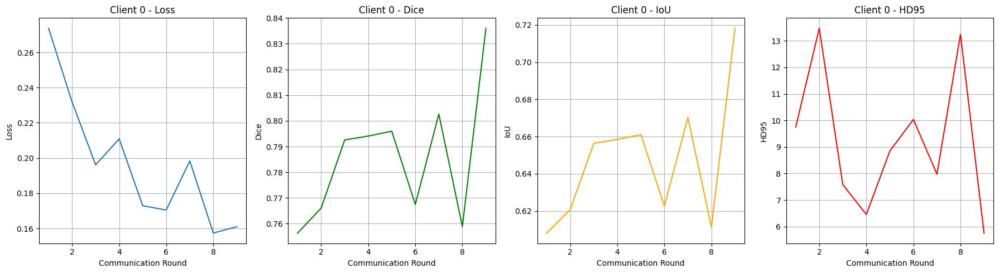

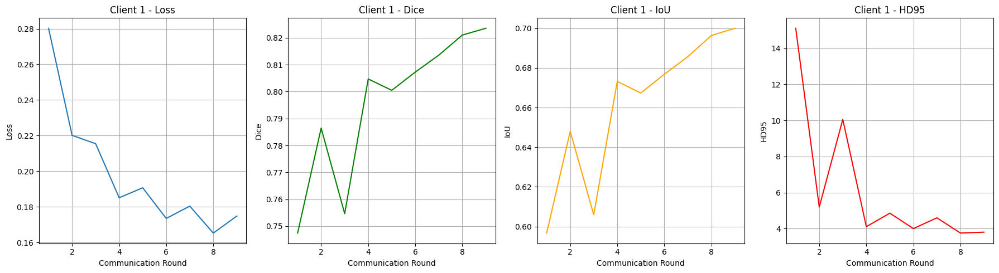

In [21]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

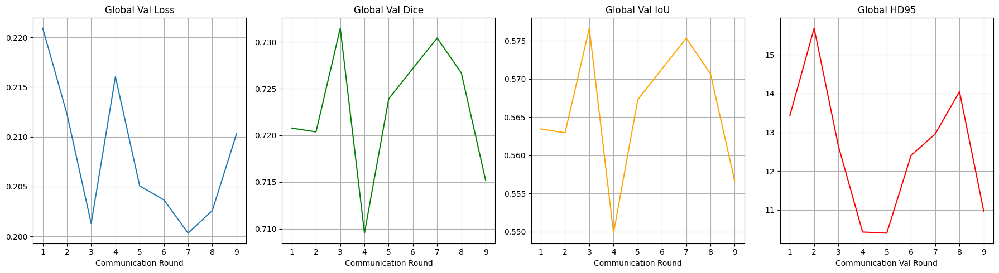

In [22]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [23]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    transform=transform,
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

# -----------------------------
# 2️⃣ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️⃣ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

all_dice = []
all_hd95 = []
all_iou = []


# -----------------------------
# 4️⃣ Evaluate on test set
# -----------------------------
global_model.eval()
all_dice = []
all_hd95 = []
all_iou = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc="Testing", leave=True)
    for batch_idx, batch in enumerate(test_bar):
        images = batch["image"].to(device, dtype=torch.float32)
        masks = batch["mask"].to(device, dtype=torch.float32)

        outputs = global_model(images)
        pred_binary = (torch.sigmoid(outputs) > 0.5).float()

        # Metrics
        dice_metric(pred_binary, masks)
        hd_metric(pred_binary, masks)

        # Optional: show running metrics in tqdm
        running_dice = dice_metric.aggregate().item()
        running_hd = hd_metric.aggregate().item()
        running_iou = running_dice / (2 - running_dice)
        test_bar.set_postfix({
            "Dice": f"{running_dice:.4f}",
            "IoU": f"{running_iou:.4f}",
            "HD95": f"{running_hd:.4f}"
        })

    # Final metrics
    mean_dice = dice_metric.aggregate().item()
    mean_hd95 = hd_metric.aggregate().item()
    mean_iou = mean_dice / (2 - mean_dice)

    print(f"\nTest Set Metrics:")
    print(f"Dice: {mean_dice:.4f}")
    print(f"IoU: {mean_iou:.4f}")
    print(f"HD95: {mean_hd95:.4f}")

    # Reset metrics for future use
    dice_metric.reset()
    hd_metric.reset()

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test samples: 29
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(8,

Testing: 100%|██████████| 29/29 [00:08<00:00,  3.23it/s, Dice=0.7064, IoU=0.5461, HD95=16.3068]


Test Set Metrics:
Dice: 0.7064
IoU: 0.5461
HD95: 16.3068


**Visualize**

29


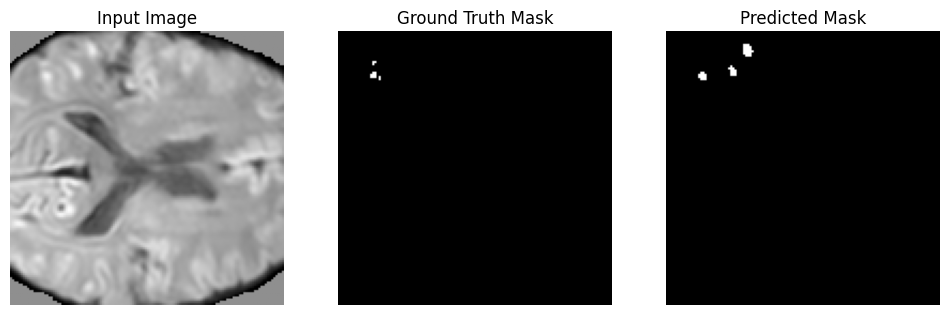

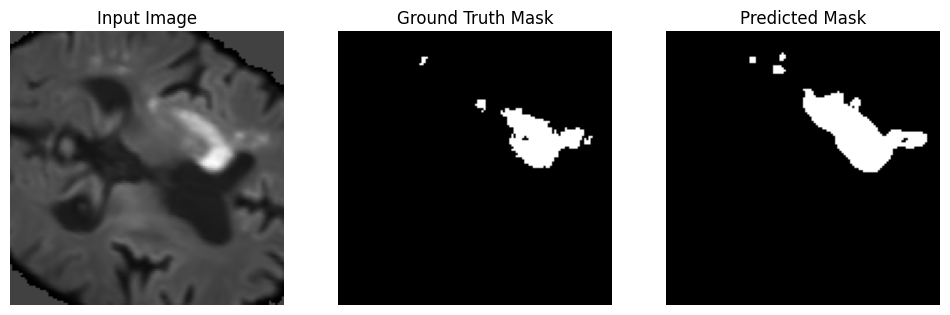

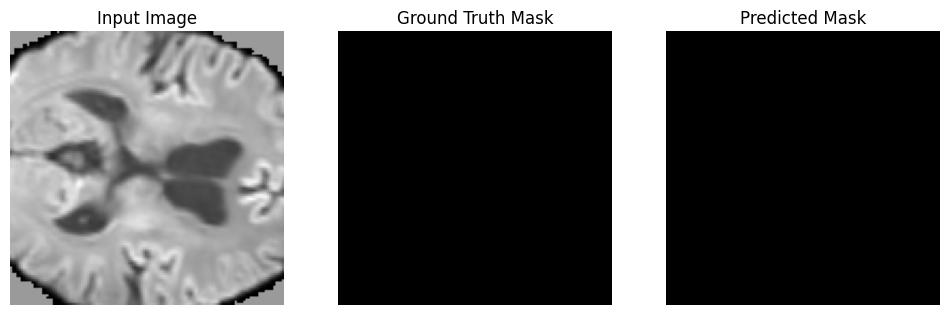

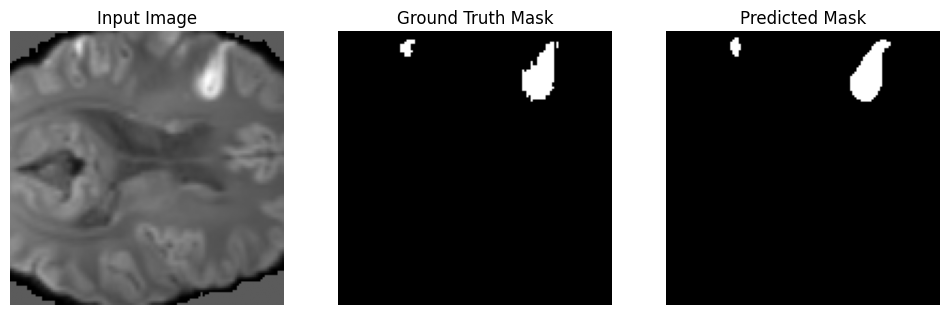

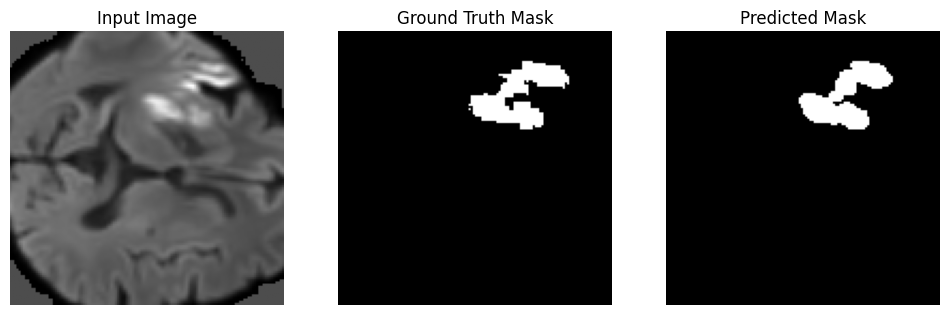

...

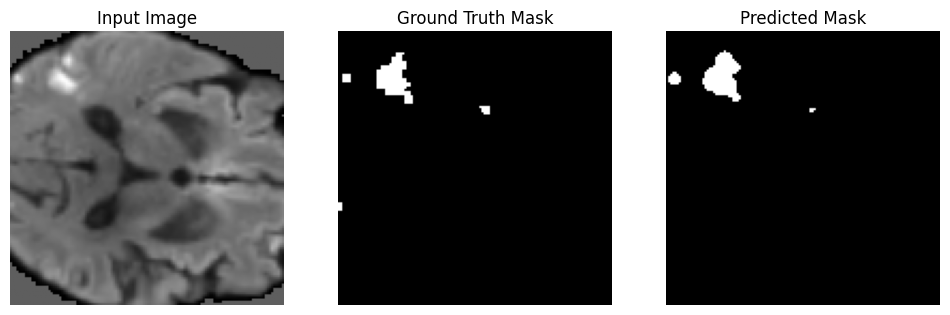

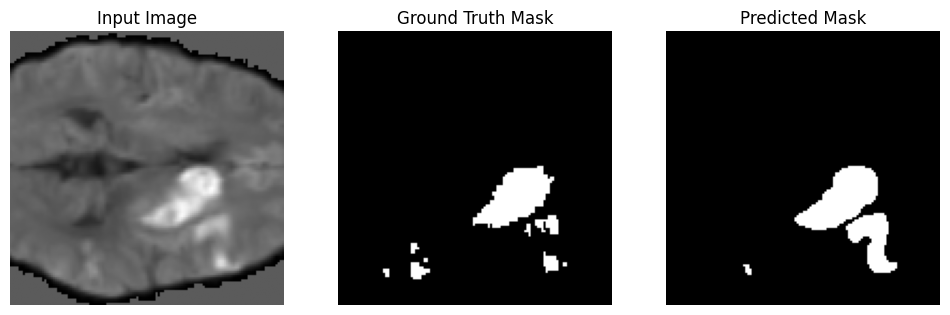

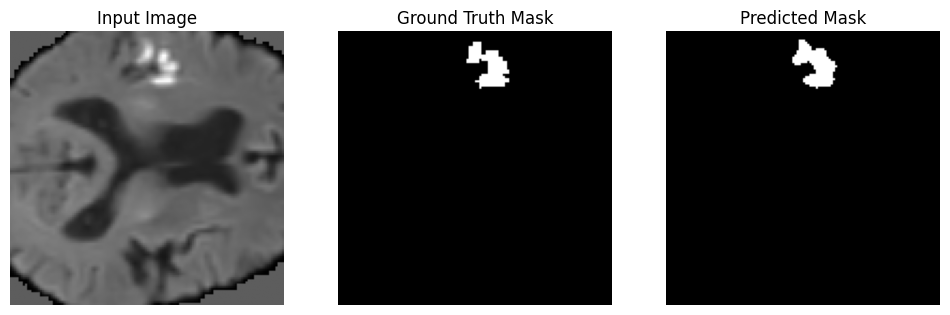

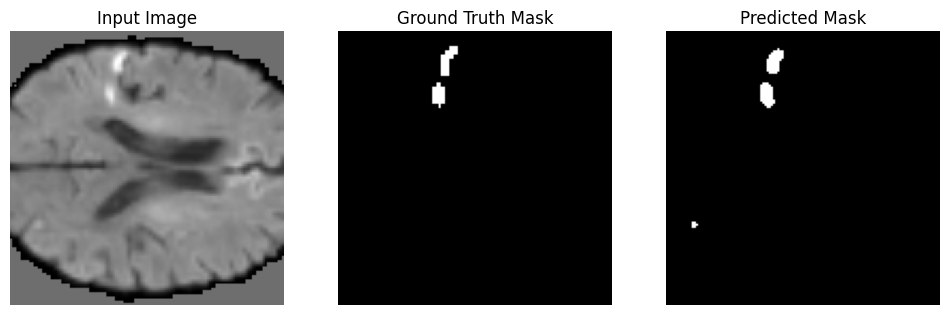

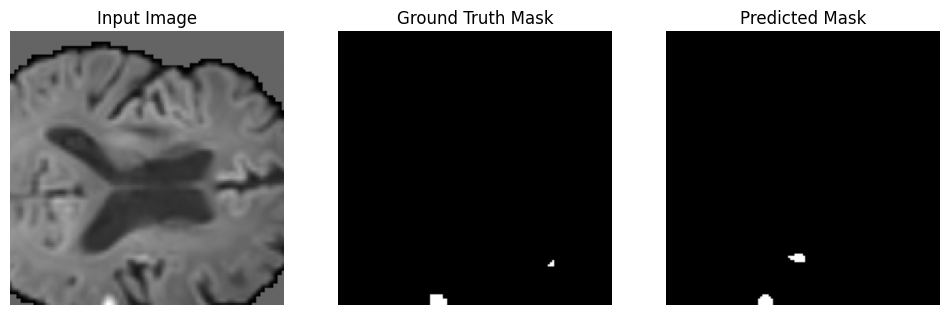

In [24]:
num_visualize = len(test_dataset)
print(num_visualize)

global_model.eval()

for i in range(num_visualize):
    sample = test_dataset[i]

    # Get tensors
    image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)
    mask_tensor  = sample["mask"]

    # Convert for visualization
    image = sample["image"][0].cpu().numpy()
    mask  = sample["mask"][0].cpu().numpy()

    # Predict
    with torch.no_grad():
        output = global_model(image_tensor)
        pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

    # Middle slice
    mid_slice = image.shape[2] // 2
    img_slice  = image[:, :, mid_slice]
    mask_slice = mask[:, :, mid_slice]
    pred_slice = pred[:, :, mid_slice]

    # Plot
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_slice, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_slice, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_slice, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()